In [6]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torchvision.models import vgg16, vgg16_bn
from torch.utils.data import Dataset
import numpy as np
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
import seaborn as sns
import math
import pandas as pd
import sys
import os
from skimage import io
import matplotlib.animation as animation
from IPython.display import HTML

custom_style = {'axes.labelcolor': 'white'}
sns.set_style("dark", rc=custom_style)
sns.set_context("notebook")
plt.style.use('dark_background')
plt.rcParams["font.size"] = 18
%matplotlib inline

In [7]:
%ls

180303-gan.ipynb             logger.py
check_result.ipynb           main_dcgan_f.py
dataset.py                   main_dcgan_mb_f.py
DCGAN-improved-Copy1.ipynb   main_dcgan.py
DCGAN-improved-Copy2.ipynb   main_dcgan_semi_learn.py
DCGAN-improved.ipynb         net.py
DCGAN.ipynb                  __pycache__/
dcgan_semi.out               result/
errorD_minibach_feature.npy  run.py
errorG_minibach_feature.npy  vat.py
img_minibach_feature.npy


In [24]:
# img = np.load('./img_minibach_feature.npy')
img = np.load('./img_test.npy')


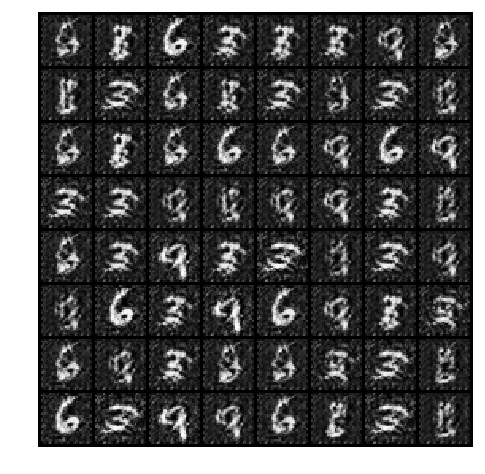

In [26]:
fig = plt.figure(figsize = (8,8))
plt.axis('off')
# ims = [[plt.imshow(np.transpose(i, (1,2,0)), animated=True)] for i in img_list2]
ims = [[plt.imshow(i, animated=True)] for i in img]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)
HTML(ani.to_jshtml())

In [33]:
errD = np.load('errorD_test.npy')
errG = np.load('errorG_test.npy')

In [34]:
errG

array([], dtype=float64)

In [12]:
%ls ./result

accuracy_minibach_feature.png  log  loss_minibach_feature.png


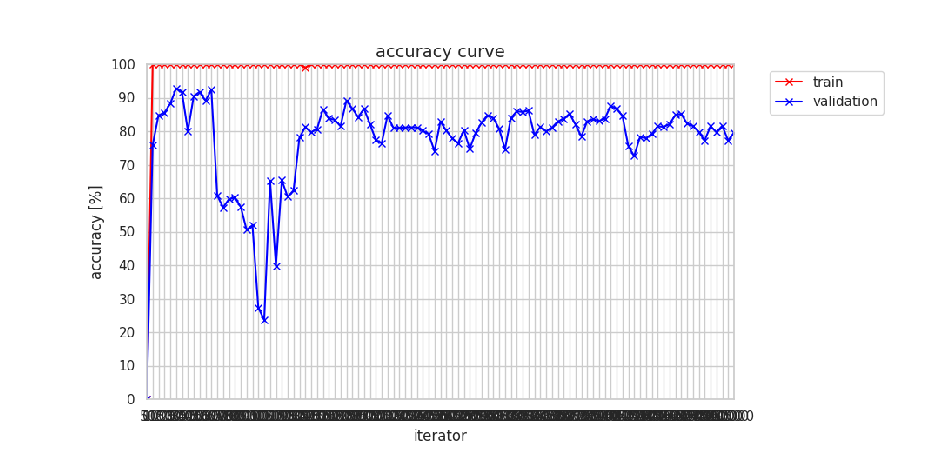

In [15]:
accuracy = Image.open('./result/accuracy_minibach_feature.png')
plt.figure(figsize=(16,8))
plt.imshow(accuracy)

In [22]:
for i in range(1,3):
    print(i)

1
2


In [48]:
import random

In [53]:
random.seed(123)
np.random.randn(10)

array([-1.29408532, -1.03878821,  1.74371223, -0.79806274,  0.02968323,
        1.06931597,  0.89070639,  1.75488618,  1.49564414,  1.06939267])

array([-0.77270871,  0.79486267,  0.31427199, -1.32626546,  1.41729905,
        0.80723653,  0.04549008, -0.23309206, -1.19830114,  0.19952407])

In [125]:
a = np.random.randint(0,10,100)

In [126]:
a

array([9, 1, 9, 5, 8, 5, 6, 8, 4, 8, 4, 1, 3, 2, 7, 0, 6, 2, 7, 3, 6, 4,
       2, 6, 9, 9, 4, 7, 0, 3, 3, 1, 2, 1, 3, 0, 4, 7, 4, 4, 7, 6, 3, 3,
       9, 6, 7, 4, 9, 1, 7, 4, 0, 1, 2, 3, 9, 0, 6, 8, 2, 4, 1, 9, 6, 0,
       3, 5, 2, 9, 6, 7, 9, 5, 7, 5, 4, 4, 7, 8, 0, 2, 2, 0, 7, 1, 1, 0,
       2, 7, 5, 9, 3, 3, 6, 5, 4, 8, 9, 6])

In [127]:
test = np.where(a==6)

In [128]:
idx = []
for i in range(10):
    print('{}: [{}]'.format(i,np.where(a==i)[0][0]))

0: [15]
1: [1]
2: [13]
3: [12]
4: [8]
5: [3]
6: [6]
7: [14]
8: [4]
9: [0]


In [129]:
test[0][0]

6

In [130]:
idx = np.arange(100)

In [131]:
a[idx]

array([9, 1, 9, 5, 8, 5, 6, 8, 4, 8, 4, 1, 3, 2, 7, 0, 6, 2, 7, 3, 6, 4,
       2, 6, 9, 9, 4, 7, 0, 3, 3, 1, 2, 1, 3, 0, 4, 7, 4, 4, 7, 6, 3, 3,
       9, 6, 7, 4, 9, 1, 7, 4, 0, 1, 2, 3, 9, 0, 6, 8, 2, 4, 1, 9, 6, 0,
       3, 5, 2, 9, 6, 7, 9, 5, 7, 5, 4, 4, 7, 8, 0, 2, 2, 0, 7, 1, 1, 0,
       2, 7, 5, 9, 3, 3, 6, 5, 4, 8, 9, 6])

In [87]:
idx

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99])

In [93]:
np.delete(idx, [5,7,8])

array([ 0,  1,  2,  3,  4,  6,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19,
       20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36,
       37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53,
       54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70,
       71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87,
       88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99])

In [94]:
a

array([8, 0, 1, 4, 7, 2, 4, 8, 3, 4, 9, 6, 2, 7, 7, 7, 4, 7, 8, 4, 0, 7,
       6, 3, 4, 1, 1, 7, 2, 7, 8, 9, 4, 4, 4, 7, 7, 9, 9, 4, 1, 5, 5, 8,
       9, 5, 1, 0, 6, 0, 9, 4, 6, 4, 5, 3, 4, 6, 2, 5, 2, 4, 3, 2, 4, 8,
       0, 6, 8, 8, 5, 6, 5, 6, 0, 4, 9, 0, 8, 0, 5, 6, 6, 8, 8, 4, 4, 0,
       1, 9, 0, 7, 5, 4, 7, 2, 3, 5, 5, 4])

In [102]:
p = np.random.permutation(len(a))

In [106]:
np.zeros(10, dtype=np.int)

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

In [112]:
i = np.zeros(10, dtype=np.int)

In [113]:
a[i]

array([8, 8, 8, 8, 8, 8, 8, 8, 8, 8])

In [115]:
b = np.arange(24).reshape(4,3,2)

In [117]:
b[1,:,:]

array([[ 6,  7],
       [ 8,  9],
       [10, 11]])

In [118]:
101//10

10

In [119]:
a = np.arange(3)
b = np.arange(3)

In [124]:
a  = np.hstack((a,b))

In [132]:
a

array([9, 1, 9, 5, 8, 5, 6, 8, 4, 8, 4, 1, 3, 2, 7, 0, 6, 2, 7, 3, 6, 4,
       2, 6, 9, 9, 4, 7, 0, 3, 3, 1, 2, 1, 3, 0, 4, 7, 4, 4, 7, 6, 3, 3,
       9, 6, 7, 4, 9, 1, 7, 4, 0, 1, 2, 3, 9, 0, 6, 8, 2, 4, 1, 9, 6, 0,
       3, 5, 2, 9, 6, 7, 9, 5, 7, 5, 4, 4, 7, 8, 0, 2, 2, 0, 7, 1, 1, 0,
       2, 7, 5, 9, 3, 3, 6, 5, 4, 8, 9, 6])

In [140]:
labeled_idx = []
each_label_num = 2
for i in range(10):
    labeled_idx = np.hstack((labeled_idx, np.where(a==i)[0][:each_label_num])).astype(np.int)

In [142]:
a[labeled_idx]

array([0, 0, 1, 1, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9])

In [143]:
labeled_idx

array([15, 28,  1, 11, 13, 17, 12, 19,  8, 10,  3,  5,  6, 16, 14, 18,  4,
        7,  0,  2])

In [145]:
np.delete(a, labeled_idx)

array([8, 6, 4, 2, 6, 9, 9, 4, 7, 3, 3, 1, 2, 1, 3, 0, 4, 7, 4, 4, 7, 6,
       3, 3, 9, 6, 7, 4, 9, 1, 7, 4, 0, 1, 2, 3, 9, 0, 6, 8, 2, 4, 1, 9,
       6, 0, 3, 5, 2, 9, 6, 7, 9, 5, 7, 5, 4, 4, 7, 8, 0, 2, 2, 0, 7, 1,
       1, 0, 2, 7, 5, 9, 3, 3, 6, 5, 4, 8, 9, 6])

In [157]:
y_labeled = np.array([6,5,3,8,4,4,8,5,9,5,6,1,7,3,0,4,9,1,9,7,0,8,3,7,6,2,0,9,6,4,3,3,9,5,1,3,6,4,3,1,2,3,8,8,8,9,9,9,9,9])

In [158]:
len(y_labeled)

50

In [159]:
y_labeled == 1

array([False, False, False, False, False, False, False, False, False,
       False, False,  True, False, False, False, False, False,  True,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False,  True, False,
       False, False, False,  True, False, False, False, False, False,
       False, False, False, False, False])

In [160]:
for i in range(10):
    print(np.sum(y_labeled == i))

3
4
2
8
5
4
5
3
6
10


In [164]:
np.delete(a, np.where(a==0)[0])

array([9, 1, 9, 5, 8, 5, 6, 8, 4, 8, 4, 1, 3, 2, 7, 6, 2, 7, 3, 6, 4, 2,
       6, 9, 9, 4, 7, 3, 3, 1, 2, 1, 3, 4, 7, 4, 4, 7, 6, 3, 3, 9, 6, 7,
       4, 9, 1, 7, 4, 1, 2, 3, 9, 6, 8, 2, 4, 1, 9, 6, 3, 5, 2, 9, 6, 7,
       9, 5, 7, 5, 4, 4, 7, 8, 2, 2, 7, 1, 1, 2, 7, 5, 9, 3, 3, 6, 5, 4,
       8, 9, 6])

In [165]:
test = []
for i in range(10):
    test.append(np.where(a==i)[0][:2])

In [166]:
test

[array([15, 28]),
 array([ 1, 11]),
 array([13, 17]),
 array([12, 19]),
 array([ 8, 10]),
 array([3, 5]),
 array([ 6, 16]),
 array([14, 18]),
 array([4, 7]),
 array([0, 2])]